# Predicting on test data

In [1]:
import numpy as np 
import pandas as pd
import torch, torch.nn as nn, time
from torch.utils.data import Dataset, DataLoader

from nnViz_pytorch import *
import matplotlib.pylab as plt
plt.style.use(['Solarize_Light2'])
%matplotlib inline
!pwd
N = 96 
CPU = torch.device('cpu')
device = CPU

/home/irina/Hackathon/environmental-hackathon


In [2]:
model = torch.load("model_co2.v2.pth", map_location=device); model.eval()
model_co2 = model.float() 
model = torch.load("model_tem.v2.pth", map_location=device); model.eval()
model_tem = model.float() 
model = torch.load("model_dew.v2.pth", map_location=device); model.eval()
model_dew = model.float() 
model = torch.load("model_hum.v2.pth" , map_location=device); model.eval()
model_hum = model.float() 

1
12240


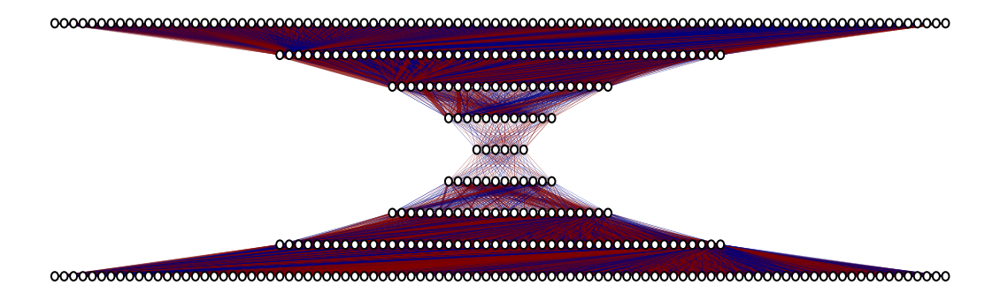

In [3]:
plt.figure(figsize=(20,6));
ax = plt.gca()
visualize_model(model_co2, ax)
plt.axis('tight'); plt.axis('off'); plt.show()

1
12240


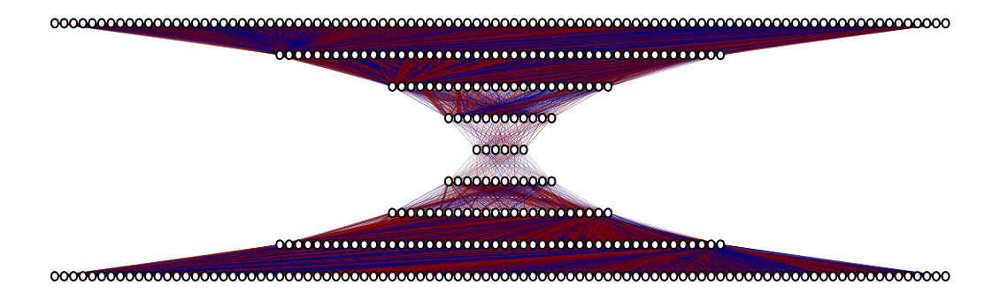

In [4]:
plt.figure(figsize=(20,6));
ax = plt.gca()
visualize_model(model_tem, ax)
plt.axis('tight'); plt.axis('off');
plt.show()

1
12240


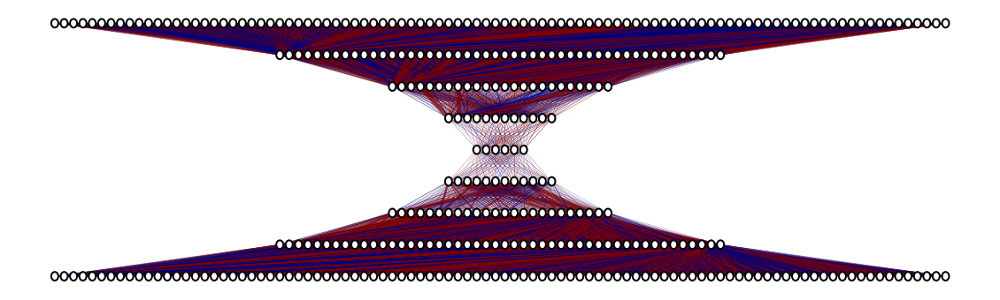

In [5]:
plt.figure(figsize=(20,6));
ax = plt.gca()
visualize_model(model_dew, ax)
plt.axis('tight'); plt.axis('off'); plt.show()


1
12240


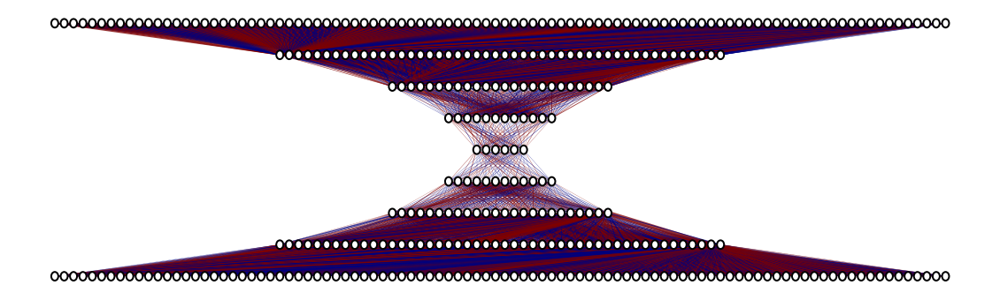

In [6]:
plt.figure(figsize=(20,6));
ax = plt.gca()
visualize_model(model_hum, ax)
plt.axis('tight'); plt.axis('off'); plt.show()

In [7]:
test_red = np.load("data/test_data_reduced.npy")
test_red.shape

(9898, 960)

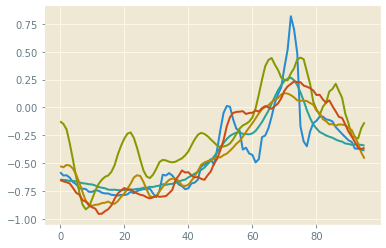

In [8]:
# check models for sanity:
s = test_red[10, :N]
v = torch.from_numpy(s).to(device)

p1 = model_co2.forward(v.float())
p2 = model_tem.forward(v.float())
p3 = model_dew.forward(v.float())
p4 = model_hum.forward(v.float())

plt.plot(v.numpy())
plt.plot(p1.data.cpu().numpy())
plt.plot(p2.data.cpu().numpy())
plt.plot(p3.data.cpu().numpy())
plt.plot(p4.data.cpu().numpy())

In [9]:
import copy
def predict_col(model, data):
    pred = copy.deepcopy(data)
    for i, d in enumerate(data):
        v = torch.from_numpy(d).to(CPU)
        p = model.forward(v.float())
        pred[i] = p.data.cpu().numpy()
    return pred    

def predict_all(models, data, debug=0):
    pred = copy.deepcopy(data)
    if debug:
        i = debug - 1
        m = models[i]
        d = data[:, i*N: (i+1)*N]
        p = predict_col(m, d)
        pred[:, i*N: (i+1)*N] = copy.copy(p)
        return pred  
    for i in range(len(models)):
        m = models[i]
        d = data[:, i*N: (i+1)*N]
        p = predict_col(m, d)
        pred[:, i*N: (i+1)*N] = copy.copy(p)
    return pred

In [10]:
models = [model_co2, model_tem, model_dew, model_hum]
test_pred = predict_all(models, test_red)

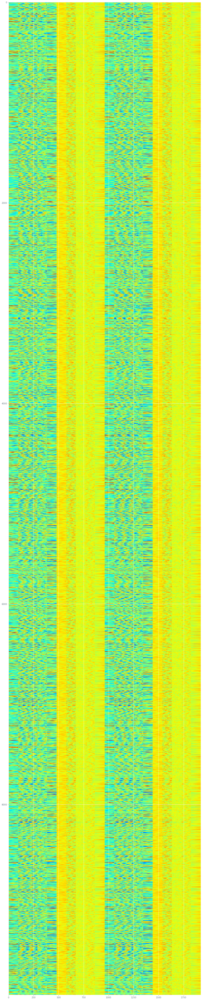

In [11]:
fig = plt.figure(figsize=(16,128))
plt.imshow(np.concatenate((test_pred,test_red),axis=1), cmap='jet', vmin=-2, vmax=2)

In [12]:
#np.save("data/test_pred_reduced.npy", test_pred)

In [13]:
def predict_line(models, data):
    pred = copy.deepcopy(data)
    N, F = 96, 4
    for j, m in enumerate(models):
        for i in range(F):
            d = data[i*N:(i+1)*N] 
            v = torch.from_numpy(d).to(CPU)
            p = m.forward(v.float())
            pred[i*N:(i+1)*N] = p.data.cpu().numpy()
    return pred    

def predict_test(models, data):
    pred = copy.deepcopy(data)
    for i, d in enumerate(data):
        pred[i,:] = predict_line(models, d)
    return pred

In [14]:
import joblib
test_data = joblib.load('/home/irina/Hackathon/environmental-hackathon/test_data/test_dataset_2019.numpy')
test_data.shape

(9898, 2112)

In [15]:
test_pred = predict_test(models, test_data)


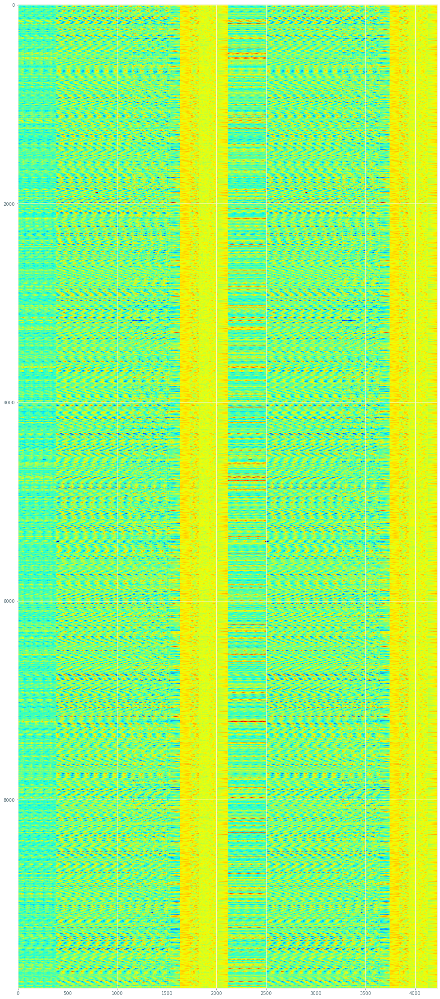

In [16]:
fig = plt.figure(figsize=(20,40))
plt.imshow(np.concatenate((test_pred,test_data),axis=1), cmap='jet', vmin=-2, vmax=2)

In [17]:
#np.save("data/test_pred_complete.npy", test_pred)

In [18]:
def prediction_error(model, data):
    mse_errors = []
    
    for d in data:
        v = torch.from_numpy(d).to(CPU)
        p = model.forward(v.float())
        r = p.data.cpu().numpy()
        mse = (np.square(r - d)).mean(axis=None)
        mse_errors.append(mse) 
    return mse_errors          

In [19]:
def total_error( models, data, debug=0):
    mse = np.zeros(data.shape[0])
    if debug:
        i = debug - 1
        m = models[i]
        d = data[:, i*N: (i+1)*N]
        mse +=  prediction_error(m, d)
        return mse  
    for i in range(len(models)):
        m = models[i]
        d = data[:, i*N: (i+1)*N]
        mse +=  prediction_error(m, d)
    return mse


In [20]:
models = [model_co2, model_tem, model_dew, model_hum]
mse1 = total_error(models, test_red[:, :N*4], 1)
mse2 = total_error(models, test_red[:, :N*4], 2)
mse3 = total_error(models, test_red[:, :N*4], 3)
mse4 = total_error(models, test_red[:, :N*4], 4)

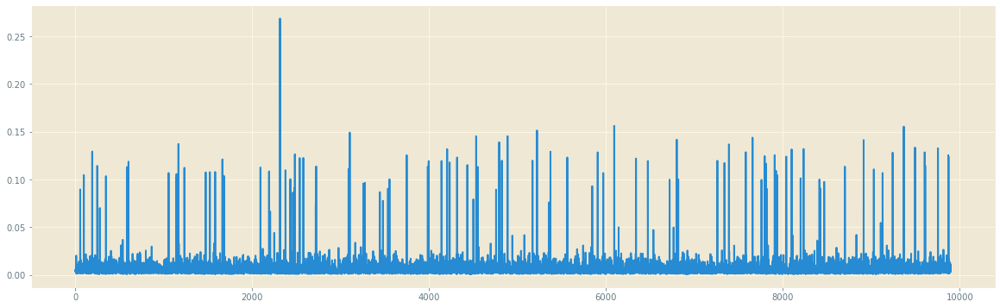

In [21]:
plt.figure(figsize=(20,6));
plt.plot(mse1)

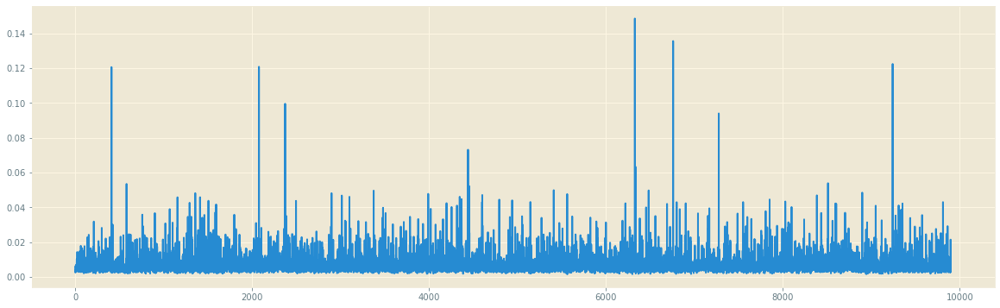

In [22]:
plt.figure(figsize=(20,6));
plt.plot(mse2)

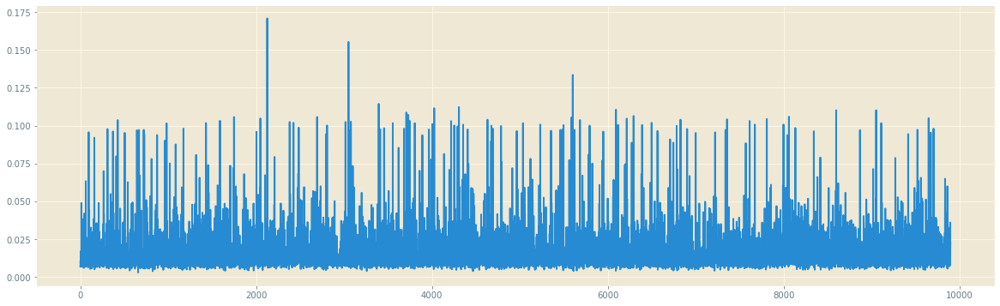

In [23]:
plt.figure(figsize=(20,6));
plt.plot(mse3)

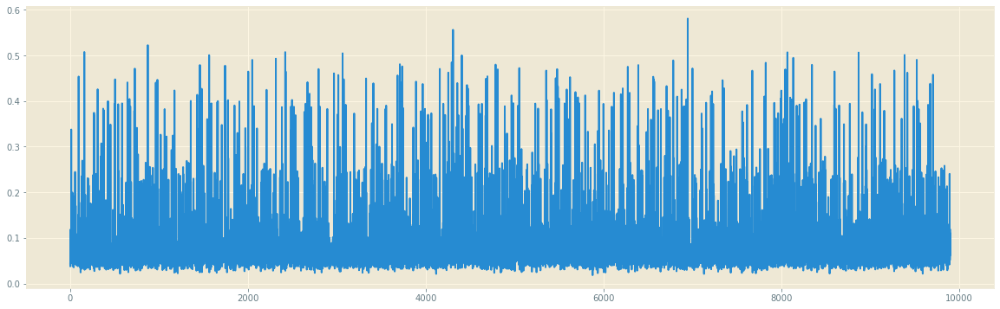

In [24]:
plt.figure(figsize=(20,6));
plt.plot(mse4)

In [25]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats


<AxesSubplot:>

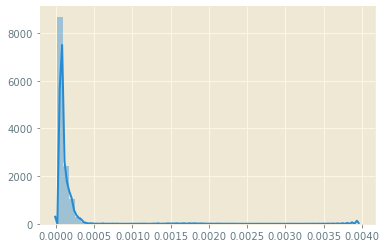

In [26]:
sns.distplot(mse1/sum(mse1))

<AxesSubplot:>

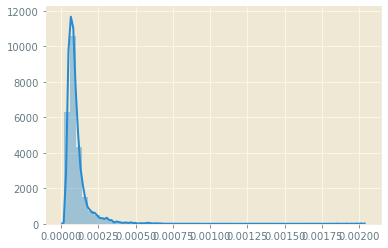

In [27]:
sns.distplot(mse2/sum(mse2))

<AxesSubplot:>

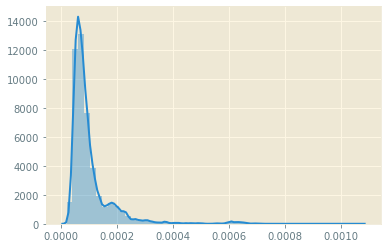

In [28]:
sns.distplot(mse3/sum(mse3))

<AxesSubplot:>

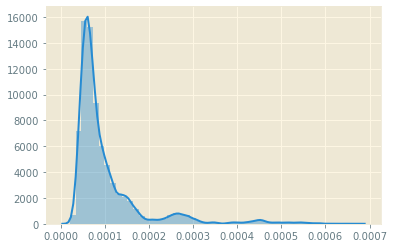

In [29]:
sns.distplot(mse4/sum(mse4))


In [30]:
print(sum(mse1), sum(mse2), sum(mse3), sum(mse4))

68.15747581871078 73.35355668328789 159.4933013606326 863.952347264678


<AxesSubplot:>

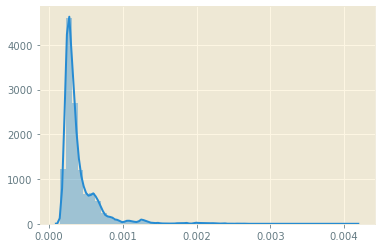

In [31]:
mse = mse1/sum(mse1) + mse2/sum(mse2) + mse3/sum(mse3) + mse4/sum(mse4) 
sns.distplot(mse)

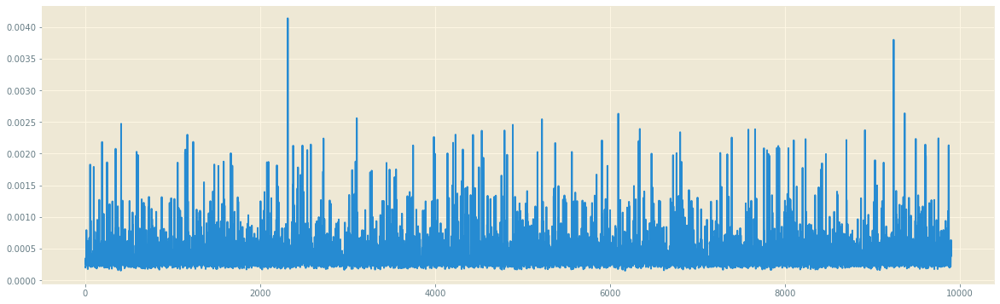

In [32]:
plt.figure(figsize=(20,6)); 
plt.plot(mse)

In [33]:
def thrcurve(err):
    n_outliers = []
    thresholds = []
    n = 100
    maxe = max(err)
    mine = sum(err)/len(err)
    for i in reversed(range(n)):
        th = mine + i *(maxe-mine)/n
        a = len([e for e in err if e >th])
        if a > 300:
            #print(a, th, maxe)
            mine = th
            break
    for i in range(n):
        th = mine + i *(maxe-mine)/n
        n_outliers.append(len([e for e in err if e >th]))
        thresholds.append(th) 
    return thresholds, n_outliers

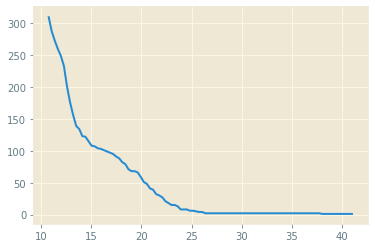

In [34]:
thresholds, outliers = thrcurve(mse*10000)
plt.plot(thresholds, outliers)

In [35]:
th = 0.0015
anom = [i for i, e in enumerate(mse) if e >th]
print(anom, len(anom))


[55, 96, 191, 248, 346, 409, 586, 601, 1055, 1140, 1144, 1166, 1233, 1356, 1474, 1521, 1581, 1663, 1680, 2076, 2093, 2190, 2314, 2372, 2376, 2431, 2461, 2477, 2482, 2537, 2578, 2718, 2723, 3050, 3089, 3099, 3103, 3256, 3274, 3443, 3478, 3535, 3552, 3747, 3985, 3990, 3995, 4140, 4204, 4232, 4306, 4316, 4432, 4500, 4532, 4550, 4757, 4792, 4793, 4822, 4887, 5169, 5220, 5372, 5561, 5562, 5844, 5906, 5969, 6093, 6326, 6339, 6473, 6719, 6759, 6800, 6817, 7259, 7339, 7390, 7580, 7657, 7758, 7794, 7810, 7820, 7907, 7922, 7933, 8038, 8099, 8200, 8234, 8413, 8422, 8467, 8701, 8913, 9028, 9127, 9241, 9367, 9494, 9603, 9609, 9753, 9870, 9872] 108


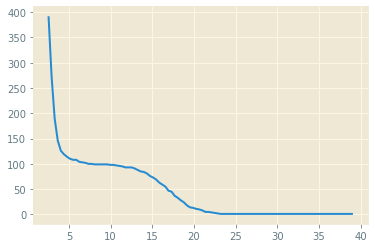

In [36]:
thresholds, outliers = thrcurve(mse1/sum(mse1)*10000)
plt.plot(thresholds, outliers)

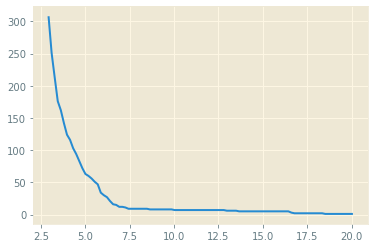

In [37]:
thresholds, outliers = thrcurve(mse2/sum(mse2)*10000)
plt.plot(thresholds, outliers)

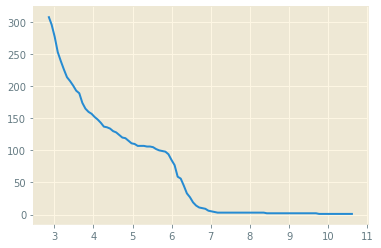

In [38]:
thresholds, outliers = thrcurve(mse3/sum(mse3)*10000)
plt.plot(thresholds, outliers)

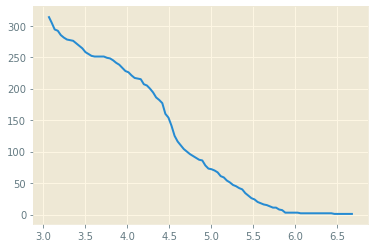

In [39]:
thresholds, outliers = thrcurve(mse4/sum(mse4)*10000)
plt.plot(thresholds, outliers)

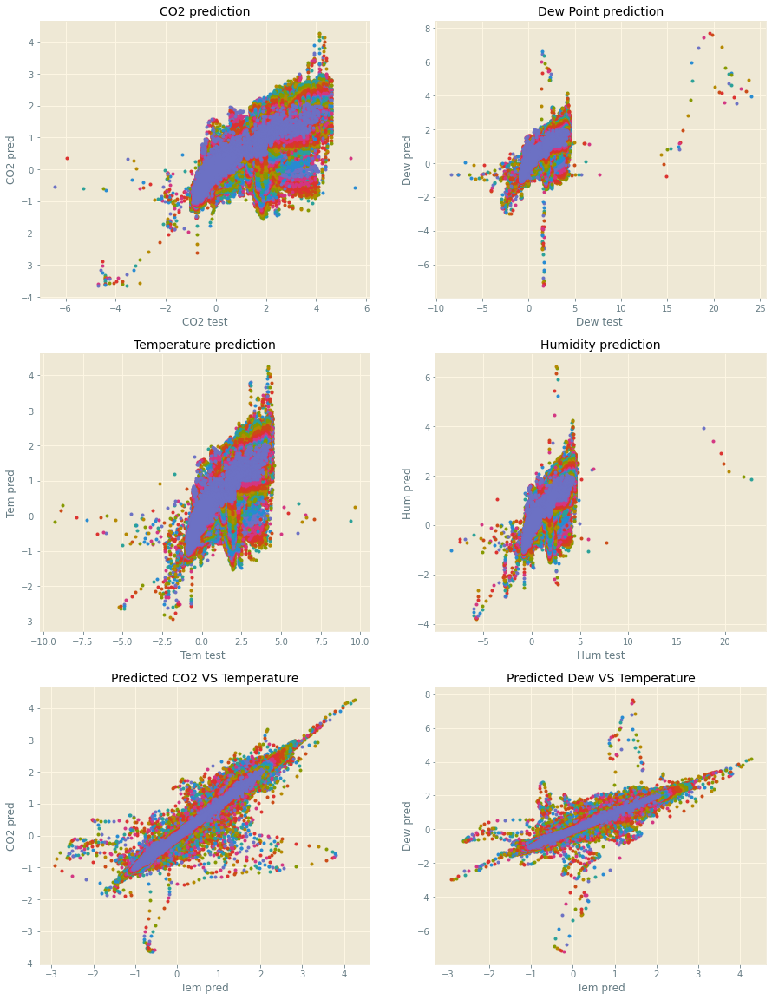

In [42]:
fs = 14
fig, axs = plt.subplots(3,2,figsize=(15,20))#, constrained_layout=True)
a = test_data
b = test_pred
axs[0,0].plot(a[:,0*96:1*96], b[:,0*96:1*96], '.')
axs[0,0].set_title('CO2 prediction', fontsize=fs)
axs[0,0].set_xlabel('CO2 test')
axs[0,0].set_ylabel('CO2 pred')

axs[1,0].plot(a[:,1*96:2*96], b[:,1*96:2*96], '.')
axs[1,0].set_title('Temperature prediction',  fontsize=fs)
axs[1,0].set_xlabel('Tem test ')
axs[1,0].set_ylabel('Tem pred')

axs[0,1].plot(a[:,2*96:3*96], b[:,2*96:3*96], '.')
axs[0,1].set_title('Dew Point prediction',  fontsize=fs)
axs[0,1].set_xlabel('Dew test ')
axs[0,1].set_ylabel('Dew pred')

axs[1,1].plot(a[:,3*96:4*96], b[:,3*96:4*96], '.')
axs[1,1].set_title('Humidity prediction',  fontsize=fs)
axs[1,1].set_xlabel('Hum test')
axs[1,1].set_ylabel('Hum pred')

axs[2,0].plot(b[:,1*96:2*96], b[:,0*96:1*96], '.')
axs[2,0].set_title('Predicted CO2 VS Temperature',  fontsize=fs)
axs[2,0].set_xlabel('Tem pred')
axs[2,0].set_ylabel('CO2 pred')

axs[2,1].plot(b[:,1*96:2*96], b[:,2*96:3*96], '.')
axs[2,1].set_title('Predicted Dew VS Temperature',  fontsize=fs)
axs[2,1].set_xlabel('Tem pred')
axs[2,1].set_ylabel('Dew pred')

plt.show()